In [ ]:
import VBMicrolensing
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import matplotlib.cm as cm

In [110]:
def plot_light_curve(t0, tE, t, u0_list, rho):
    """
    Docstring
    """
    VBM = VBMicrolensing.VBMicrolensing()
    VBM.RelTol = 1e-3
    VBM.Tol = 1e-3
    VBM.astrometry = True 

    tau = (t - t0)/tE

    plt.figure(figsize=(12, 5))

    cmap_es = plt.colormaps['BuPu']
    colors_es = [cmap_es(i) for i in np.linspace(0.5, 1.0, len(u0_list))]

    cmap_ps = plt.colormaps['binary']
    colors_ps = [cmap_ps(i) for i in np.linspace(0.5, 1.0, len(u0_list))]

    for idx, u0 in enumerate(u0_list):
        color_es = colors_es[idx]
        color_ps = colors_ps[idx]
        u = np.sqrt(u0**2 + tau**2)

        pspl_mag = []
        espl_mag = []

        for ui in u:
            pspl = VBM.PSPLMag(ui)
            espl = VBM.ESPLMag2(ui, rho)
            pspl_mag.append(pspl)
            espl_mag.append(espl)

        plt.plot(tau, espl_mag, '-', color=color_es, label = f'ESPL $u_0$ = {u0}')
        plt.plot(tau, pspl_mag, '--', color=color_ps, label=f'PSPL $u_0$ = {u0}', alpha = 0.7)

        plt.xlabel(r"Time ($\tau$)")
        plt.ylabel('Magnification')
        plt.title('Single-Lens Magnification')
        plt.legend()
        plt.grid(True)

def plot_cent_shift(t0, tE, t, u0_list, rho):
    """
    Docstring
    """
    VBM = VBMicrolensing.VBMicrolensing()
    VBM.RelTol = 1e-3
    VBM.Tol = 1e-3
    VBM.astrometry = True 

    tau = (t - t0)/tE

    plt.figure(figsize=(12, 5))

    cmap_cs = plt.colormaps['BuPu']
    colors_cs = [cmap_cs(i) for i in np.linspace(0.5, 1.0, len(u0_list))]

    for idx, u0 in enumerate(u0_list):
        color_cs = colors_cs[idx]
        u = np.sqrt(u0**2 + tau**2)

        centroid_shift = []
        
        for ui in u:
            shift = VBM.astrox1 - ui 

            centroid_shift.append(shift)
        
        plt.plot(tau, centroid_shift, color=color_cs, label = f'$u_0$ = {u0}')

        plt.xlabel(r"Time ($\tau$)")
        plt.ylabel(r"Centroid Shift ($\Delta \theta$)")
        plt.title('Astrometric Centroid Shift')
        plt.legend()
        plt.grid(True)



In [ ]:
#Parameters
t0 = 0.0
tE = 20.0
u0 = [0.1, 0.2, 0.3, 0.5, 0.8]
rho = 0.01
t = np.linspace(t0-tE, t0+tE, 100)

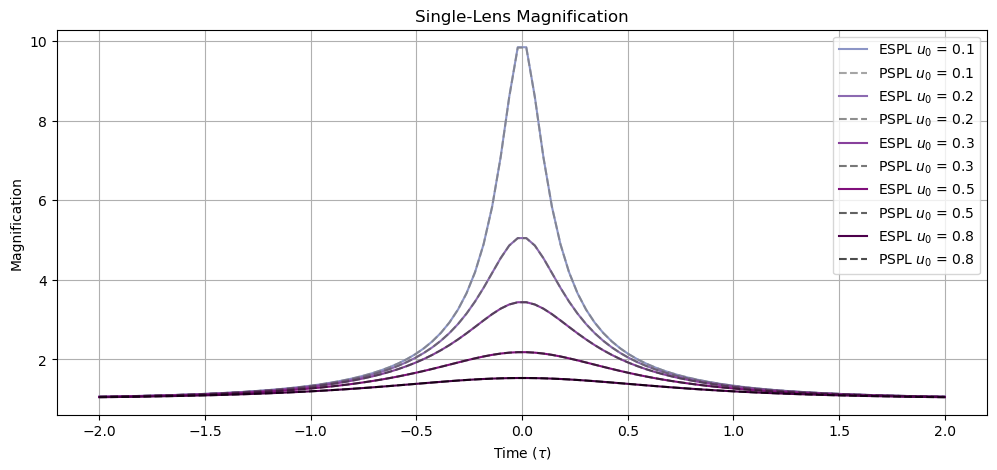

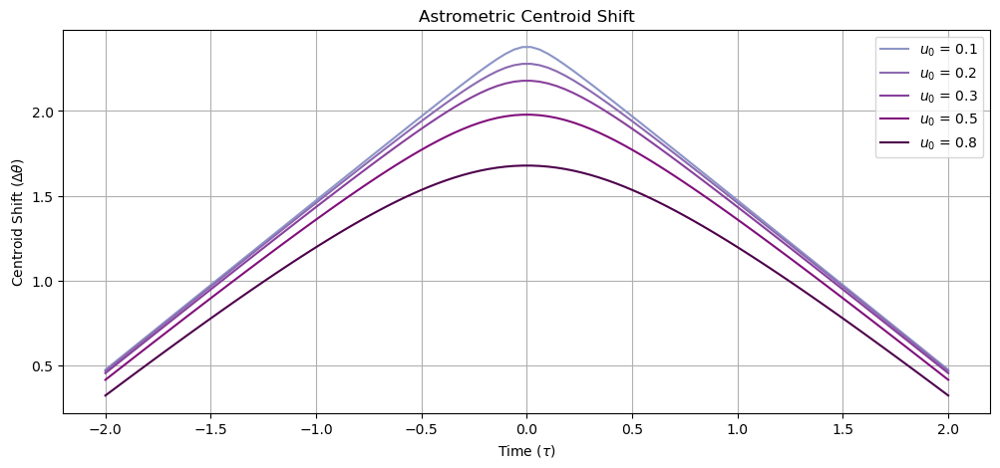

In [112]:
plot_light_curve(
    t0=t0,
    tE=tE,
    t = t,
    u0_list = u0,
    rho = rho)

plot_cent_shift(
    t0=t0,
    tE=tE,
    t = t,
    u0_list = u0,
    rho = rho)

In [115]:
def animate_1L1S(t0, tE, t, u0_list, rho):

    """ 
    Docstring
    """
    
    from VBMicrolensing import VBMicrolensing
    VBM = VBMicrolensing()
    VBM.RelTol = 1e-3
    VBM.Tol = 1e-3

    tau = (t - t0) / tE
    n = len(t)
    colors = [plt.colormaps['BuPu'](i) for i in np.linspace(0.5, 1.0, len(u0_list))]

    systems = []
    for u0, color in zip(u0_list, colors):
        x_source = tau
        y_source = np.full_like(tau, u0)
        u = np.sqrt(x_source**2 + y_source**2)
        espl_mag = [VBM.ESPLMag2(ui, rho) for ui in u]
        systems.append({'u0': u0, 'x': x_source, 'y': y_source, 'mag': espl_mag, 'color': color})


    fig, ax = plt.subplots(figsize=(6, 6))
    ax.set_xlim(-2, 2)
    ax.set_ylim(-2, 2)
    ax.set_xlabel(r"X ($\theta_E$)")
    ax.set_ylabel(r"Y ($\theta_E$)")
    ax.set_title("Single-Lens Microlensing Events")
    ax.grid(True)
    ax.set_aspect('equal')

    ax.plot([0], [0], 'ko', label="Lens")
    einstein_ring = plt.Circle((0, 0), 1, color='green', fill=False, linestyle='--', linewidth=1.5, label='Einstein Ring')
    ax.add_patch(einstein_ring)

    source_dots = []
    img_dots = []
    trails_1 = []
    trails_2 = []
    trail_data = []

    for system in systems:
        s_dot, = ax.plot([], [], marker = '*', color=system['color'], label=f"$u_0$ = {system['u0']}")
        i_dot = ax.scatter([], [], color=system['color'], s=20)
        t1 = ax.scatter([], [], color=system['color'], alpha=0.3)
        t2 = ax.scatter([], [], color=system['color'], alpha=0.3)
        source_dots.append(s_dot)
        img_dots.append(i_dot)
        trails_1.append(t1)
        trails_2.append(t2)
        trail_data.append({'x1': [], 'y1': [], 's1': [], 'x2': [], 'y2': [], 's2': []})

    ax.legend(loc='lower left')

    # Animation update
    def update(frame):
        for i, system in enumerate(systems):
            x_s = system['x'][frame]
            y_s = system['y'][frame]
            u = np.sqrt(x_s**2 + y_s**2)
            theta = np.arctan2(y_s, x_s)
            r_plus = (u + np.sqrt(u**2 + 4)) / 2
            r_minus = (u - np.sqrt(u**2 + 4)) / 2

            x1 = r_plus * np.cos(theta)
            y1 = r_plus * np.sin(theta)
            x2 = r_minus * np.cos(theta)
            y2 = r_minus * np.sin(theta)

            source_dots[i].set_data([x_s], [y_s])
            img_dots[i].set_offsets([[x1, y1], [x2, y2]])

            mag = system['mag'][frame]
            size = 20 * mag
            img_dots[i].set_sizes([size, size])

            # Trails
            trail_data[i]['x1'].append(x1)
            trail_data[i]['y1'].append(y1)
            trail_data[i]['s1'].append(size)
            trail_data[i]['x2'].append(x2)
            trail_data[i]['y2'].append(y2)
            trail_data[i]['s2'].append(size)

            trails_1[i].set_offsets(np.column_stack([trail_data[i]['x1'], trail_data[i]['y1']]))
            trails_1[i].set_sizes(trail_data[i]['s1'])

            trails_2[i].set_offsets(np.column_stack([trail_data[i]['x2'], trail_data[i]['y2']]))
            trails_2[i].set_sizes(trail_data[i]['s2'])

        return source_dots + img_dots + trails_1 + trails_2

    ani = animation.FuncAnimation(fig, update, frames=n, interval=50, blit=True)
    plt.close(fig)
    return HTML(ani.to_jshtml())


In [116]:
animate_1L1S(t0=t0,
    tE=tE,
    t = t,
    u0_list = u0,
    rho = rho)